## Question 3 : BLIP vs CLIP

### Part 1

In [1]:
!pip install transformers torch torchvision pillow -q
!pip install ftfy regex tqdm -q
!pip install git+https://github.com/openai/CLIP.git -q
!pip install open_clip_torch -q

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.6 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 8.1 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 16.5 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 13.6 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 8.3 MB/s eta 0:00:000:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 84.5 MB/s eta 0:00:00:00:0100:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.12.0 requires pylibraft-cu12==24.12.*, but you have pylibraft-cu12 25.2.0 which is incompatible.
pylibcugraph-cu12 24.12.0 requires rmm-cu12==24.12.*, but you have 

In [2]:
import torch
import torch.nn.functional as F
from PIL import Image
from transformers import BlipProcessor, BlipForConditionalGeneration
import os
import matplotlib.pyplot as plt
import clip
from open_clip import create_model_from_pretrained, get_tokenizer

device = "cuda" if torch.cuda.is_available() else "cpu"

processor = BlipProcessor.from_pretrained("Salesforce/blip-image-captioning-large")
model = BlipForConditionalGeneration.from_pretrained("Salesforce/blip-image-captioning-large").to(device)

2025-04-20 14:35:09.009131: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745159709.190038      31 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745159709.244953      31 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/527 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/711k [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.60k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.88G [00:00<?, ?B/s]

### Part 2

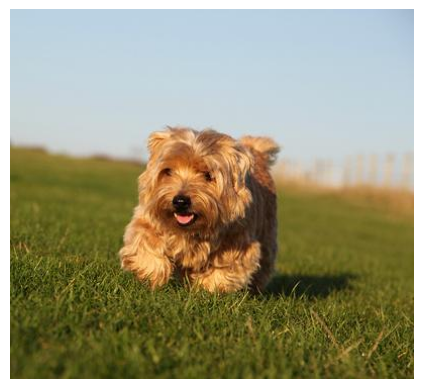

Image: ILSVRC2012_test_00000004.jpg
Caption: arafed dog running in a field of grass with a sky background



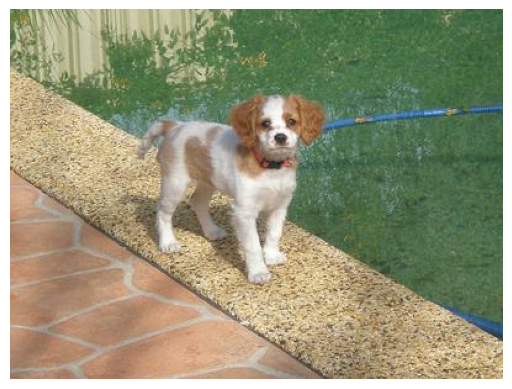

Image: ILSVRC2012_test_00000022.jpg
Caption: there is a small dog standing on a ledge near a pool



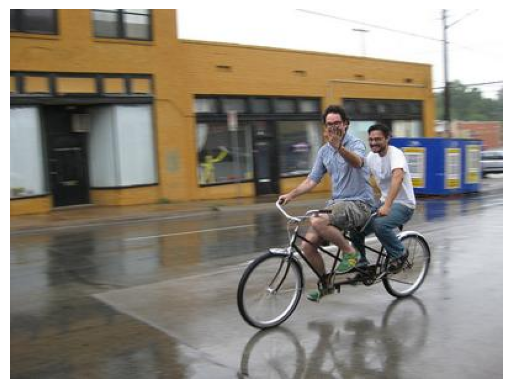

Image: ILSVRC2012_test_00000023.jpg
Caption: they are riding on a bike in the rain in the street



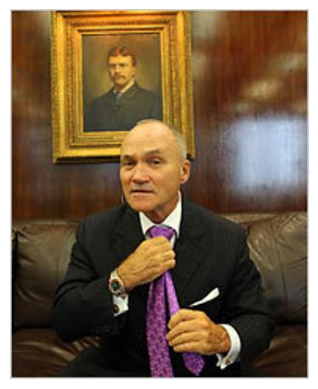

Image: ILSVRC2012_test_00000026.jpg
Caption: arafed man in a suit and tie sitting on a couch



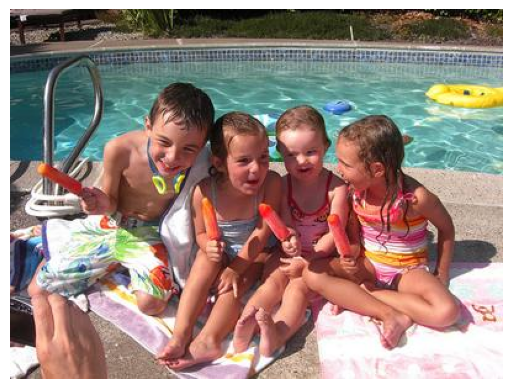

Image: ILSVRC2012_test_00000018.jpg
Caption: there are four children sitting on a towel by a pool



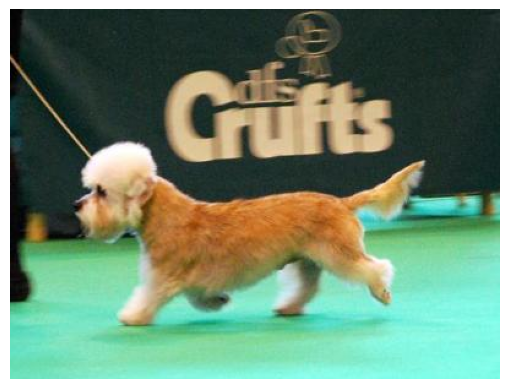

Image: ILSVRC2012_test_00000003.jpg
Caption: araffe dog running on a leash at a dog show



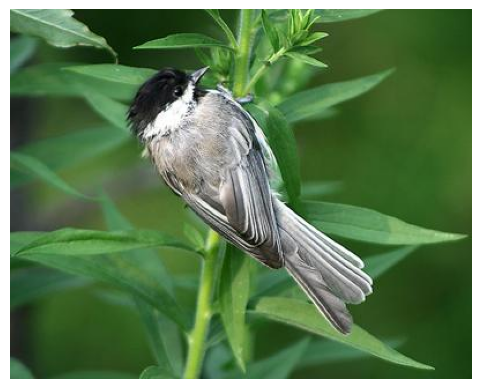

Image: ILSVRC2012_test_00000019.jpg
Caption: there is a bird that is sitting on a plant with green leaves



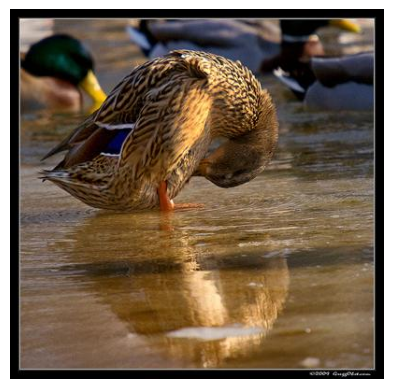

Image: ILSVRC2012_test_00000030.jpg
Caption: ducks are standing in the water and one is drinking



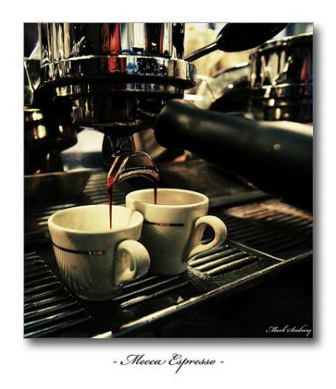

Image: ILSVRC2012_test_00000034.jpg
Caption: two cups of coffee being poured into a coffee machine



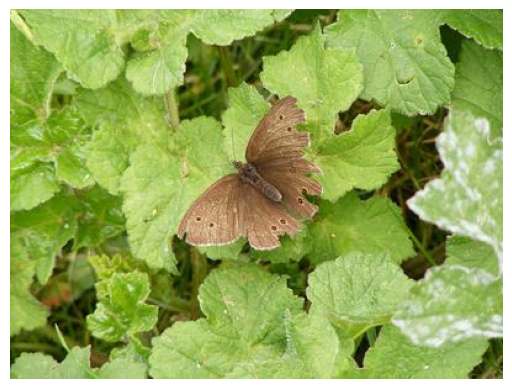

Image: ILSVRC2012_test_00000025.jpg
Caption: there is a brown butterfly sitting on a leaf in the grass



In [3]:
images = "/kaggle/input/cv-hw3-q3/samples"

captions = {}
for img in os.listdir(images):
    img_path = os.path.join(images, img)
    image = Image.open(img_path).convert("RGB")
    
    inputs = processor(image, return_tensors="pt").to(device)
    out = model.generate(**inputs)
    caption = processor.decode(out[0], skip_special_tokens=True)
    
    captions[img] = caption
    
    plt.imshow(image)
    plt.axis('off')
    plt.show()

    print(f"Image: {img}")
    print(f"Caption: {caption}\n")    

### Part 3

100%|████████████████████████████████████████| 338M/338M [00:03<00:00, 111MiB/s]


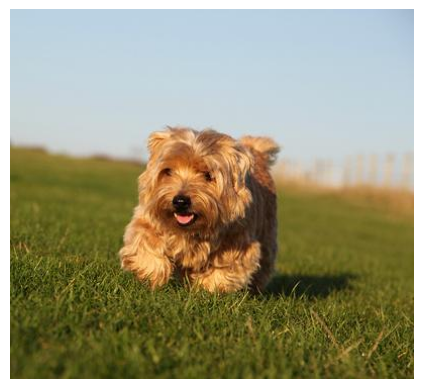

Image: ILSVRC2012_test_00000004.jpg
Caption: arafed dog running in a field of grass with a sky background
CLIP Similarity Score: 0.3078



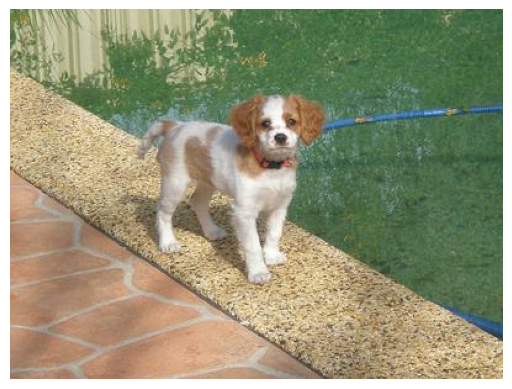

Image: ILSVRC2012_test_00000022.jpg
Caption: there is a small dog standing on a ledge near a pool
CLIP Similarity Score: 0.3024



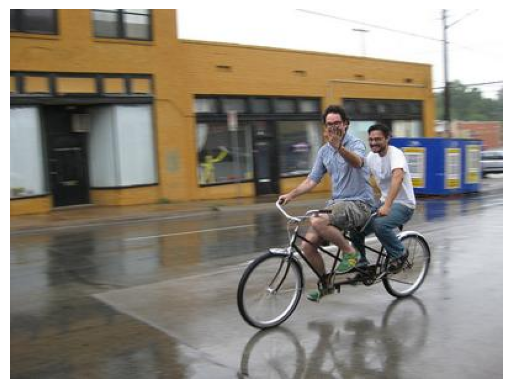

Image: ILSVRC2012_test_00000023.jpg
Caption: they are riding on a bike in the rain in the street
CLIP Similarity Score: 0.3242



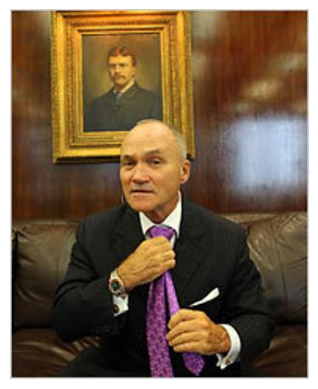

Image: ILSVRC2012_test_00000026.jpg
Caption: arafed man in a suit and tie sitting on a couch
CLIP Similarity Score: 0.2868



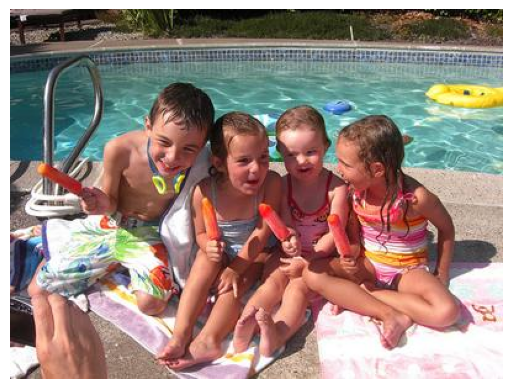

Image: ILSVRC2012_test_00000018.jpg
Caption: there are four children sitting on a towel by a pool
CLIP Similarity Score: 0.3367



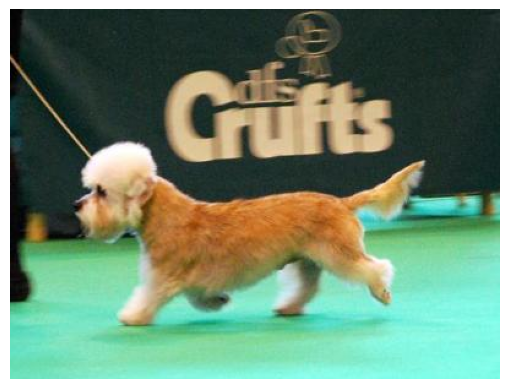

Image: ILSVRC2012_test_00000003.jpg
Caption: araffe dog running on a leash at a dog show
CLIP Similarity Score: 0.3321



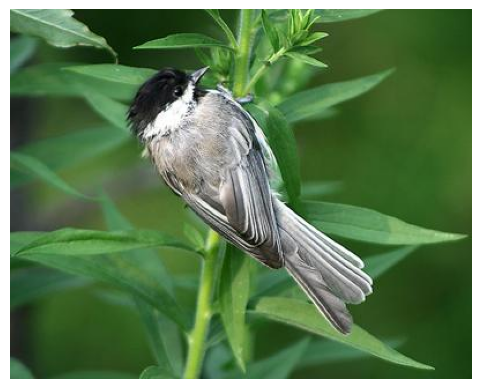

Image: ILSVRC2012_test_00000019.jpg
Caption: there is a bird that is sitting on a plant with green leaves
CLIP Similarity Score: 0.2658



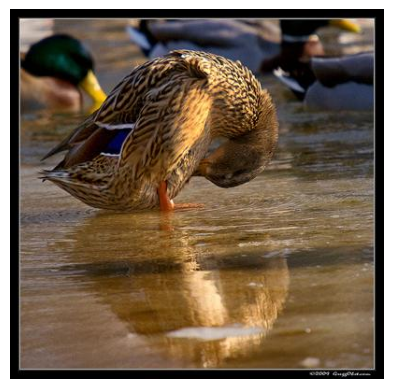

Image: ILSVRC2012_test_00000030.jpg
Caption: ducks are standing in the water and one is drinking
CLIP Similarity Score: 0.3054



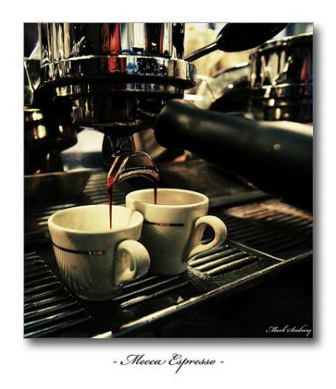

Image: ILSVRC2012_test_00000034.jpg
Caption: two cups of coffee being poured into a coffee machine
CLIP Similarity Score: 0.3021



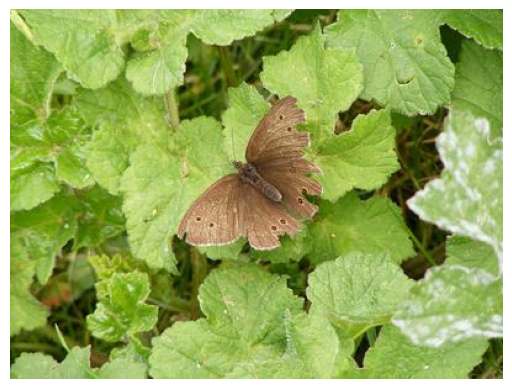

Image: ILSVRC2012_test_00000025.jpg
Caption: there is a brown butterfly sitting on a leaf in the grass
CLIP Similarity Score: 0.2904



In [4]:
model, preprocess = clip.load("ViT-B/32", device=device)

for img, caption in captions.items():
    img_path = os.path.join(images, img)
    image = preprocess(Image.open(img_path)).unsqueeze(0).to(device)
    caption_tokens = clip.tokenize([caption]).to(device)
    
    with torch.no_grad():
        image_features = model.encode_image(image).float()
        caption_features  = model.encode_text(caption_tokens).float()  

    image_features /= image_features.norm(dim=-1, keepdim=True)
    caption_features  /= caption_features.norm(dim=-1, keepdim=True)
    similarity = caption_features.cpu().numpy() @ image_features.cpu().numpy().T

    plt.imshow(Image.open(img_path))
    plt.axis('off')
    plt.show()

    print(f"Image: {img}")
    print(f"Caption: {caption}")   
    print(f"CLIP Similarity Score: {similarity.item():.4f}\n")

### Part 4

open_clip_pytorch_model.bin:   0%|          | 0.00/1.66G [00:00<?, ?B/s]

open_clip_config.json:   0%|          | 0.00/943 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

/tmp/ipykernel_31/3412264749.py:11: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.no_grad(), torch.cuda.amp.autocast():


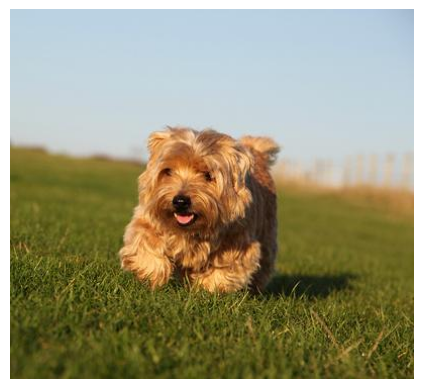

Image: ILSVRC2012_test_00000004.jpg
Caption: arafed dog running in a field of grass with a sky background
CLIPS Similarity Score: 0.1627



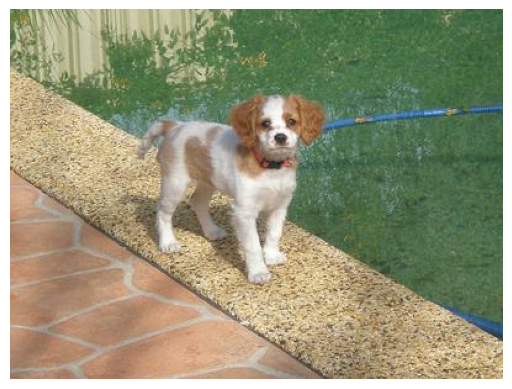

Image: ILSVRC2012_test_00000022.jpg
Caption: there is a small dog standing on a ledge near a pool
CLIPS Similarity Score: 0.1485



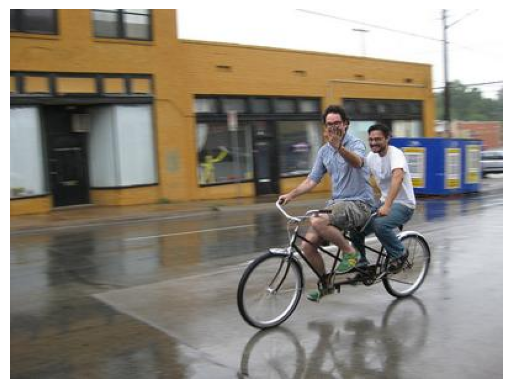

Image: ILSVRC2012_test_00000023.jpg
Caption: they are riding on a bike in the rain in the street
CLIPS Similarity Score: 0.1798



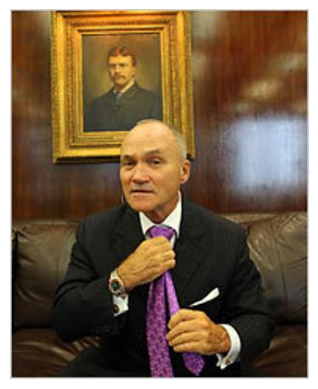

Image: ILSVRC2012_test_00000026.jpg
Caption: arafed man in a suit and tie sitting on a couch
CLIPS Similarity Score: 0.1295



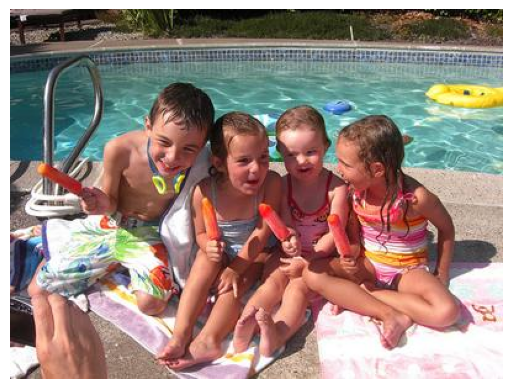

Image: ILSVRC2012_test_00000018.jpg
Caption: there are four children sitting on a towel by a pool
CLIPS Similarity Score: 0.2089



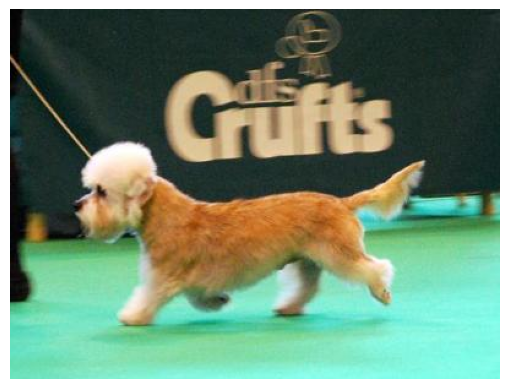

Image: ILSVRC2012_test_00000003.jpg
Caption: araffe dog running on a leash at a dog show
CLIPS Similarity Score: 0.1776



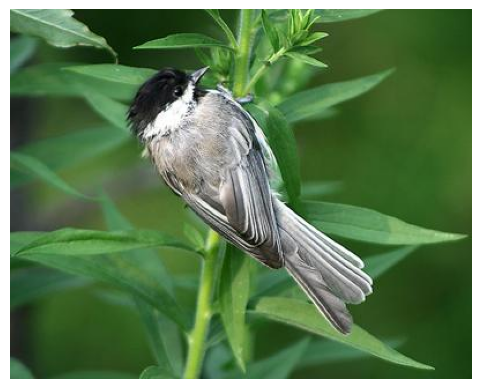

Image: ILSVRC2012_test_00000019.jpg
Caption: there is a bird that is sitting on a plant with green leaves
CLIPS Similarity Score: 0.0926



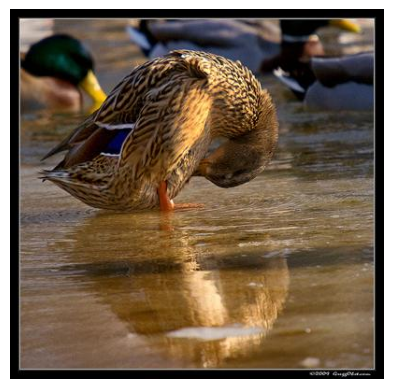

Image: ILSVRC2012_test_00000030.jpg
Caption: ducks are standing in the water and one is drinking
CLIPS Similarity Score: 0.1705



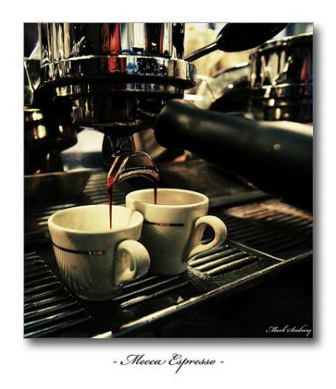

Image: ILSVRC2012_test_00000034.jpg
Caption: two cups of coffee being poured into a coffee machine
CLIPS Similarity Score: 0.1521



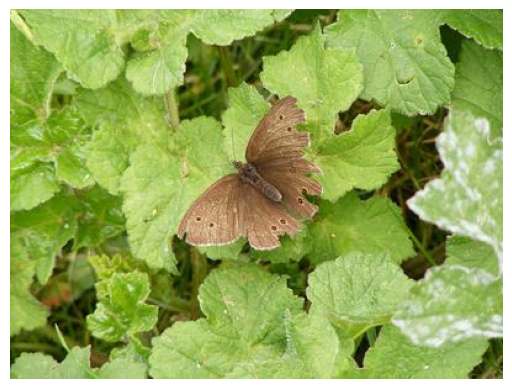

Image: ILSVRC2012_test_00000025.jpg
Caption: there is a brown butterfly sitting on a leaf in the grass
CLIPS Similarity Score: 0.1237



In [5]:
model, preprocess = create_model_from_pretrained('hf-hub:UCSC-VLAA/ViT-L-14-CLIPS-Recap-DataComp-1B')
tokenizer = get_tokenizer('hf-hub:UCSC-VLAA/ViT-L-14-CLIPS-Recap-DataComp-1B')

for img, caption in captions.items():
    img_path = os.path.join(images, img)
    image = Image.open(img_path)
    image = preprocess(image).unsqueeze(0)

    text = tokenizer([caption], context_length=model.context_length)
    
    with torch.no_grad(), torch.cuda.amp.autocast():
        image_features = model.encode_image(image)  
        text_features = model.encode_text(text)    
        
        image_features = F.normalize(image_features, dim=-1)
        text_features = F.normalize(text_features, dim=-1)
        
        similarity = image_features @ text_features.T

    plt.imshow(Image.open(img_path))
    plt.axis('off')
    plt.show()

    print(f"Image: {img}")
    print(f"Caption: {caption}")   
    print(f"CLIPS Similarity Score: {similarity.item():.4f}\n")